# **The Price of Parenthood: A Data-Driven Look at Childcare Cost in America**

This notebook explores how childcare prices relate to household income, geography (urban vs. rural), workforce participation, and race/ethnicity in the U.S. Using the National Database of Childcare Prices (NDCP) and related socioeconomic indicators, we quantify patterns and visualize trends to support a clear narrative: childcare costs have risen faster than incomes, are highest in large metros, and correlate with lower labor force participation—especially among mothers. We close with a call for better, more granular data to inform policy.

**Problem Statement**
Childcare costs are rising faster than household income, especially in urban areas, yet policymakers lack sufficiently granular data to understand affordability drivers or target interventions effectively.


## **Research Questions & Agenda (place right after Overview)**

**Research Questions**
1. How have childcare prices changed over the last decade relative to household income?
1. How do costs vary by community size (urbanization)?
1. How are childcare costs linked to workforce participation and unemployment?
1. Do cost burdens differ across racial/ethnic groups—and if so, why?
1. What additional data is needed to design effective policy?

Notebook Flow (matches slides)

Rising Childcare Prices → Prices vs Income → Urbanization → Workforce Participation → Costs & Race → Call to Action.

## **Data Sources & Scope**

* **Primary:** NDCP childcare prices by care type (center vs family) and child age group, adjusted to constant dollars where noted.
* **Context:** Median household income series for comparison; labor statistics for unemployment and participation; basic demographics.  Covers the years 2008 to 2018.
* **Unit of analysis:** Geographic aggregations consistent with NDCP (with population bins for community-size analyses) and demographic segments for correlation heatmaps.

Why these data? They let us align costs with ability to pay (income), access proxies (population size), and labor outcomes (participation/unemployment).

## **Cleaning & Preparation (brief, before first charts)**

**Steps (high level)**

* Normalize nominal prices to a consistent price level when comparing across years.
* Map geographies to population-size buckets (e.g., rural ↔ metro 1M+) to study urbanization effects.
* Join income and labor stats to NDCP by geography/year for comparisons and correlations.
* Create care-type (center vs family) and age-band features for stratified plots.

**Why this matters**

* Makes apples-to-apples comparisons across time and place, and allows us to test the specific claims in the article and deck (rising prices vs income; metro cost premiums; heatmaps linking costs to labor outcomes).

## Import Required Libraries

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import nbformat
import seaborn as sns
import numpy as np
import re
from sklearn.feature_selection import mutual_info_regression

## Load the Dataset

In [2]:
# Load the datasets
childcare_data_path = '../data/nationaldatabaseofchildcareprices.xlsx'

# Inspect the structure of each dataset to understand them better
df = pd.read_excel(childcare_data_path, sheet_name='nationaldatabaseofchildcare')

In [3]:
# Display the first few rows of each dataset to understand their structure
display(df.sample(5, random_state=42))

,State_Name,State_Abbreviation,County_Name,County_FIPS_Code,StudyYear,UNR_16,FUNR_16,MUNR_16,UNR_20to64,FUNR_20to64,...,MFCCToddler,MFCCToddler_flag,MFCCPreschool,MFCCPreschool_flag,_75FCCInfant,_75FCCInfant_flag,_75FCCToddler,_75FCCToddler_flag,_75FCCPreschool,_75FCCPreschool_flag
18501,Nebraska,NE,Dundy County,31057,2008,2.73,0.00,5.64,2.92,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30415,Texas,TX,Wichita County,48485,2009,5.55,5.60,5.51,4.80,4.8,...,78.2,1.0,72.10,1.0,102.63,2.0,93.42,1.0,86.83,1.0
21830,North Carolina,NC,Watauga County,37189,2015,9.47,7.88,10.81,7.30,5.7,...,139.4,1.0,133.67,1.0,174.84,3.0,162.70,1.0,156.01,1.0
25976,South Carolina,SC,York County,45091,2014,10.40,9.89,10.93,9.70,9.5,...,92.5,1.0,100.00,1.0,120.00,1.0,120.00,1.0,113.00,1.0
31737,Virginia,VA,Orange County,51137,2011,9.24,6.52,11.68,9.00,6.3,...,110.0,1.0,110.00,1.0,125.50,2.0,125.00,1.0,125.00,1.0


In [4]:
# Childcare data frame column and shape details
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34567 entries, 0 to 34566
Columns: 227 entries, State_Name to _75FCCPreschool_flag
dtypes: float64(159), int64(65), object(3)
memory usage: 59.9+ MB


In [5]:
df.describe()

,County_FIPS_Code,StudyYear,UNR_16,FUNR_16,MUNR_16,UNR_20to64,FUNR_20to64,MUNR_20to64,FLFPR_20to64,FLFPR_20to64_Under6,...,MFCCToddler,MFCCToddler_flag,MFCCPreschool,MFCCPreschool_flag,_75FCCInfant,_75FCCInfant_flag,_75FCCToddler,_75FCCToddler_flag,_75FCCPreschool,_75FCCPreschool_flag
count,34567.000000,34567.000000,34567.000000,34567.00000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,34567.000000,...,23383.000000,23383.000000,23383.000000,23383.000000,23383.000000,23383.000000,23383.000000,23383.00000,23383.000000,23383.000000
mean,30388.132786,2012.999711,7.465902,7.02902,7.860291,6.900073,6.482007,7.275457,70.086125,68.821409,...,106.759749,1.153359,104.189510,1.287859,128.909289,1.792841,120.784283,1.18800,117.897482,1.294316
std,15161.015383,3.162232,3.538619,3.56342,4.037657,3.446199,3.477956,3.990758,7.696499,11.758088,...,29.982431,0.532176,28.961701,0.696762,38.543010,0.818080,35.334666,0.58367,34.111188,0.708542
min,1001.000000,2008.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,33.600000,0.000000,...,43.080000,1.000000,40.030000,1.000000,50.000000,1.000000,50.000000,1.00000,46.450000,1.000000
25%,18177.000000,2010.000000,5.100000,4.64000,5.200000,4.600000,4.200000,4.700000,65.100000,62.600000,...,85.085000,1.000000,84.255000,1.000000,100.830000,1.000000,95.850000,1.00000,95.000000,1.000000
50%,29177.000000,2013.000000,7.050000,6.59000,7.390000,6.500000,6.000000,6.800000,70.600000,69.600000,...,100.250000,1.000000,99.650000,1.000000,123.150000,2.000000,115.000000,1.00000,112.500000,1.000000
75%,45081.000000,2016.000000,9.350000,8.88000,9.920000,8.700000,8.250000,9.200000,75.500000,76.100000,...,124.950000,1.000000,120.200000,1.000000,146.950000,3.000000,136.270000,1.00000,132.760000,1.000000
max,56045.000000,2018.000000,36.110000,38.24000,39.740000,33.900000,44.500000,45.500000,100.000000,100.000000,...,376.320000,3.000000,331.340000,3.000000,502.970000,3.000000,439.220000,3.00000,386.720000,3.000000


In [6]:
# Clean column names for readability
df.columns = df.columns.str.strip().str.lower()
df.columns

Index(['state_name', 'state_abbreviation', 'county_name', 'county_fips_code',
       'studyyear', 'unr_16', 'funr_16', 'munr_16', 'unr_20to64',
       'funr_20to64',
       ...
       'mfcctoddler', 'mfcctoddler_flag', 'mfccpreschool',
       'mfccpreschool_flag', '_75fccinfant', '_75fccinfant_flag',
       '_75fcctoddler', '_75fcctoddler_flag', '_75fccpreschool',
       '_75fccpreschool_flag'],
      dtype='object', length=227)

In [7]:
childcare_df = df.copy()

## Feature Engineering

* Population Size
* Drop unneeded columns

In [8]:
# Define population size categories based on total population
def categorize_population(pop):
    if pop < 100000:
        return "1-100K"
    elif 100000 <= pop < 500000:
        return "100K-500K"
    elif 500000 <= pop < 1000000:
        return "500K-1M"
    else:
        return "1M+"

# Check the column name for total population
population_column = "totalpop" if "totalpop" in childcare_df.columns else "TotalPop"

# Create the new column
childcare_df["pop_size"] = childcare_df[population_column].apply(categorize_population)

In [9]:
# List of columns to drop
columns_to_drop = [
    "iunr_16", "ifunr_16", "imunr_16", "iunr_20to64", "ifunr_20to64", "imunr_20to64",
    "iflfpr_20to64", "iflfpr_20to64_under6", "iflfpr_20to64_6to17", "iflfpr_20to64_under6_6to17",
    "imlfpr_20to64", "ipr_f", "ipr_p", "imhi", "ime", "ifme", "imme", "imhi_2018", "ime_2018",
    "ifme_2018", "imme_2018", "itotalpop", "ionerace", "ionerace_w", "ionerace_b", "ionerace_i",
    "ionerace_a", "ionerace_h", "ionerace_other", "itworaces", "ihispanic", "ihouseholds",
    "ih_under6_bothwork", "ih_under6_fwork", "ih_under6_mwork", "ih_under6_singlem",
    "ih_6to17_bothwork", "ih_6to17_fwork", "ih_6to17_mwork", "ih_6to17_singlem", "iemp_m",
    "imemp_m", "ifemp_m", "iemp_service", "imemp_service", "ifemp_service", "iemp_sales",
    "imemp_sales", "ifemp_sales", "iemp_n", "imemp_n", "ifemp_n", "iemp_p", "imemp_p",
    "ifemp_p", "mcbto5", "mc6to11", "mc12to17", "mc18to23", "mc24to29", "mc30to35",
    "mc36to41", "mc42to47", "mc48to53", "mc54tosa", "mfccbto5", "mfcc6to11", "mfcc12to17",
    "mfcc18to23", "mfcc24to29", "mfcc30to35", "mfcc36to41", "mfcc42to47", "mfcc48to53",
    "mfcc54tosa", "_75cbto5", "_75c6to11", "_75c12to17", "_75c18to23", "_75c24to29",
    "_75c30to35", "_75c36to41", "_75c42to47", "_75c48to53", "_75c54tosa", "_75fccbto5",
    "_75fcc6to11", "_75fcc12to17", "_75fcc18to23", "_75fcc24to29", "_75fcc30to35",
    "_75fcc36to41", "_75fcc42to47", "_75fcc48to53", "_75fcc54tosa", "imcbto5", "imc6to11",
    "imc12to17", "imc18to23", "imc24to29", "imc30to35", "imc36to41", "imc42to47", "imc48to53",
    "imc54tosa", "imcsa", "imfccbto5", "imfcc6to11", "imfcc12to17", "imfcc18to23",
    "imfcc24to29", "imfcc30to35", "imfcc36to41", "imfcc42to47", "imfcc48to53", "imfcc54tosa",
    "imfccsa", "i_75cbto5", "i_75c6to11", "i_75c12to17", "i_75c18to23", "i_75c24to29",
    "i_75c30to35", "i_75c36to41", "i_75c42to47", "i_75c48to53", "i_75c54tosa", "i_75csa",
    "i_75fccbto5", "i_75fcc6to11", "i_75fcc12to17", "i_75fcc18to23", "i_75fcc24to29",
    "i_75fcc30to35", "i_75fcc36to41", "i_75fcc42to47", "i_75fcc48to53", "i_75fcc54tosa",
    "i_75fccsa", "mcinfant_flag", "mctoddler_flag", "mcpreschool_flag", "_75cinfant_flag",
    "_75ctoddler_flag", "_75cpreschool_flag", "mfccinfant_flag", "mfcctoddler_flag",
    "mfccpreschool_flag", "_75fccinfant_flag", "_75fcctoddler_flag", "_75fccpreschool_flag"
]

# Drop the specified columns if they exist in the dataset
childcare_df = childcare_df.drop(columns=[col for col in columns_to_drop if col in childcare_df.columns], errors='ignore')

In [10]:
# rename cost columns
rename_mapping = {
    "mcinfant": "infant_center_cost",
    "mctoddler": "toddler_center_cost",
    "mcpreschool": "preschool_center_cost",
    "mcsa": "school_age_center_cost",
    "mfccinfant": "infant_family_cost",
    "mfcctoddler": "toddler_family_cost",
    "mfccpreschool": "preschool_family_cost",
    "mfccsa": "school_age_family_cost",
}

childcare_df.rename(columns=rename_mapping, inplace=True)


In [11]:
childcare_df["DollarAdj2018Factor"] = childcare_df["mhi_2018"] / childcare_df["mhi"]

In [12]:
# List of cost categories to adjust for 2018 dollars
cost_columns_to_adjust = [
    "infant_center_cost", "toddler_center_cost", "preschool_center_cost", "school_age_center_cost",
    "infant_family_cost", "toddler_family_cost", "preschool_family_cost", "school_age_family_cost"
]

# Ensure the columns exist in the dataset
existing_cost_columns_to_adjust = [col for col in cost_columns_to_adjust if col in childcare_df.columns]

# Create new columns for adjusted costs in 2018 dollars
for col in existing_cost_columns_to_adjust:
    adjusted_col_name = f"{col}_2018_dollars"
    childcare_df[adjusted_col_name] = childcare_df[col] * 52 * childcare_df["DollarAdj2018Factor"]


In [13]:
# List of cost categories to adjust for 2018 dollars
cost_columns_to_adjust_2018 = [
    "infant_center_cost_2018_dollars", "toddler_center_cost_2018_dollars", "preschool_center_cost_2018_dollars", "school_age_center_cost_2018_dollars",
    "infant_family_cost_2018_dollars", "toddler_family_cost_2018_dollars", "preschool_family_cost_2018_dollars", "school_age_family_cost_2018_dollars"
]

# Ensure the columns exist in the dataset
existing_cost_columns_to_adjust_2018 = [col for col in cost_columns_to_adjust_2018 if col in childcare_df.columns]

# Create new columns to represent the percentage of MHI_2018 that each childcare cost category represents
for col in existing_cost_columns_to_adjust_2018:
    percent_col_name = f"{col}_pct_MHI_2018"
    childcare_df[percent_col_name] = (childcare_df[col] / childcare_df["mhi_2018"]) * 100

In [14]:
childcare_df.sample(50, random_state=42).to_csv("../data/ndcp_python.csv")

## Visualizations

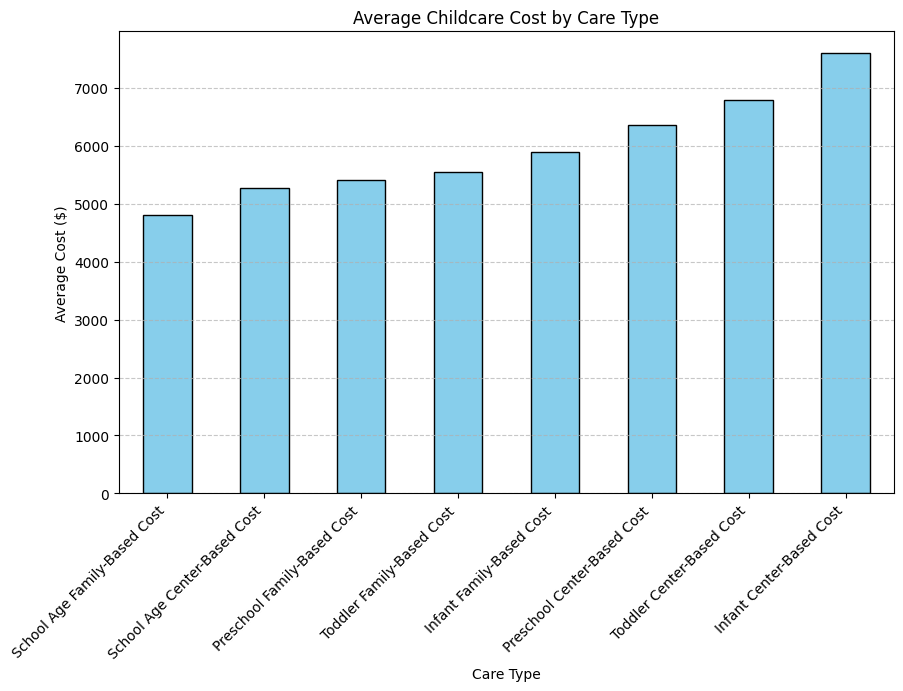

In [15]:
# Mapping of column names to more readable labels
readable_labels = {
    "infant_center_cost": "Infant Center-Based Cost",
    "toddler_center_cost": "Toddler Center-Based Cost",
    "preschool_center_cost": "Preschool Center-Based Cost",
    "school_age_center_cost": "School Age Center-Based Cost",
    "infant_family_cost": "Infant Family-Based Cost",
    "toddler_family_cost": "Toddler Family-Based Cost",
    "preschool_family_cost": "Preschool Family-Based Cost",
    "school_age_family_cost": "School Age Family-Based Cost"
}

# Ensure we only use existing columns based on the original readable labels
existing_original_cost_columns = [col for col in readable_labels.keys() if col in childcare_df.columns]

# Convert weekly costs to annual costs (52 weeks)
df_annual = childcare_df[existing_original_cost_columns] * 52

# Compute average costs with column renaming applied dynamically
avg_annual_costs = df_annual.mean()
avg_annual_costs.index = [readable_labels[col] for col in avg_annual_costs.index]

# Create the bar chart
plt.figure(figsize=(10, 6))
avg_annual_costs.sort_values().plot(kind="bar", color="skyblue", edgecolor="black")
plt.xlabel("Care Type")
plt.ylabel("Average Cost ($)")
plt.title("Average Childcare Cost by Care Type")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the chart
plt.show()



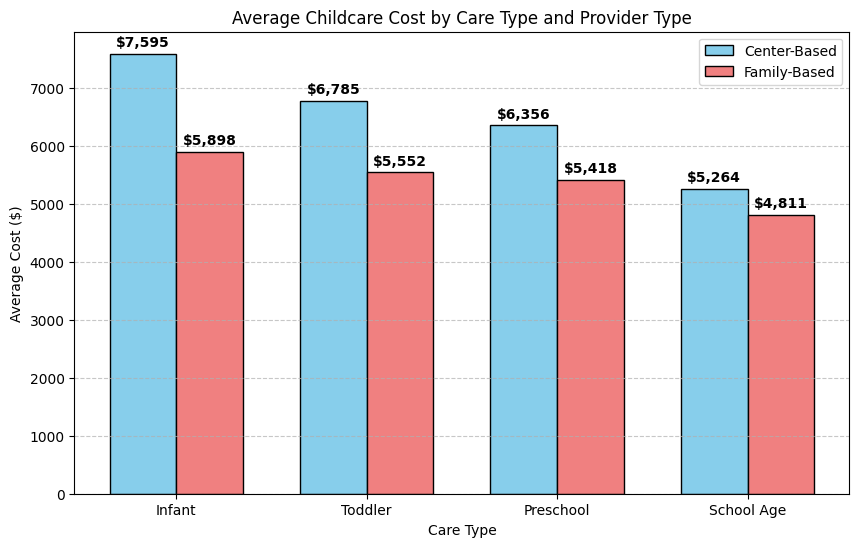

In [16]:
# Define the categories (age groups)
categories = ["Infant", "Toddler", "Preschool", "School Age"]

# Define the cost types
cost_types = ["Center-Based", "Family-Based"]

# Extract relevant data
center_costs = [avg_annual_costs[readable_labels[f"{cat.lower().replace(" ","_")}_center_cost"]] for cat in categories]
family_costs = [avg_annual_costs[readable_labels[f"{cat.lower().replace(" ","_")}_family_cost"]] for cat in categories]

# Set positions for the bars
x = np.arange(len(categories))
width = 0.35  # Width of bars

# Create the grouped bar chart
fig, ax = plt.subplots(figsize=(10, 6))
# Create bars
bars1 = ax.bar(x - width/2, center_costs, width, label="Center-Based", color="skyblue", edgecolor="black")
bars2 = ax.bar(x + width/2, family_costs, width, label="Family-Based", color="lightcoral", edgecolor="black")

# Add labels on bars
for bar in bars1:
    height = bar.get_height()
    ax.annotate(f"${height:,.0f}",
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # Offset label slightly above bar
                textcoords="offset points",
                ha="center", va="bottom", fontsize=10, fontweight="bold")

for bar in bars2:
    height = bar.get_height()
    ax.annotate(f"${height:,.0f}",
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # Offset label slightly above bar
                textcoords="offset points",
                ha="center", va="bottom", fontsize=10, fontweight="bold")

# Add labels and formatting
ax.set_xlabel("Care Type")
ax.set_ylabel("Average Cost ($)")
ax.set_title("Average Childcare Cost by Care Type and Provider Type")
ax.set_xticks(x)
ax.set_xticklabels(categories)
ax.legend()

# Show grid for readability
ax.yaxis.grid(True, linestyle="--", alpha=0.7)

# Show the plot
plt.show()


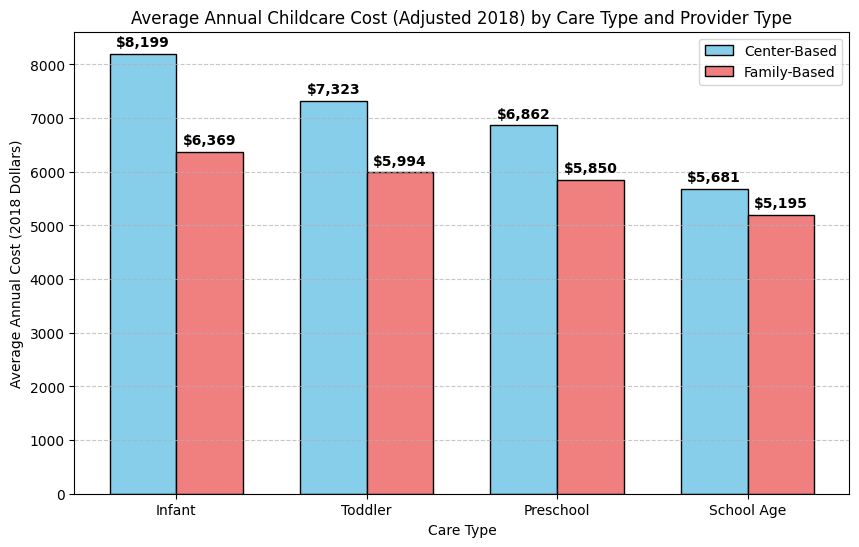

In [17]:
# Mapping of column names to more readable labels
readable_labels_2018 = {
    "infant_center_cost_2018_dollars": "Infant Center-Based Cost",
    "toddler_center_cost_2018_dollars": "Toddler Center-Based Cost",
    "preschool_center_cost_2018_dollars": "Preschool Center-Based Cost",
    "school_age_center_cost_2018_dollars": "School Age Center-Based Cost",
    "infant_family_cost_2018_dollars": "Infant Family-Based Cost",
    "toddler_family_cost_2018_dollars": "Toddler Family-Based Cost",
    "preschool_family_cost_2018_dollars": "Preschool Family-Based Cost",
    "school_age_family_cost_2018_dollars": "School Age Family-Based Cost"
}

# Ensure we only use existing columns based on the original readable labels
existing_original_cost_columns_2018 = [col for col in readable_labels_2018.keys() if col in childcare_df.columns]

# Compute the mean of the adjusted 2018 cost columns
avg_annual_costs_2018 = childcare_df[existing_original_cost_columns_2018].mean()

# Rename indices using readable labels
avg_annual_costs_2018.index = [readable_labels_2018[col] for col in avg_annual_costs_2018.index]

# Define categories
categories = ["Infant", "Toddler", "Preschool", "School Age"]

# Extract costs
center_costs_2018 = [avg_annual_costs_2018.get(f"{cat} Center-Based Cost", 0) for cat in categories]
family_costs_2018 = [avg_annual_costs_2018.get(f"{cat} Family-Based Cost", 0) for cat in categories]

# Set positions for the bars
x = np.arange(len(categories))

# Create the grouped bar chart
fig, ax = plt.subplots(figsize=(10, 6))
bars1 = ax.bar(x - width/2, center_costs_2018, width, label="Center-Based", color="skyblue", edgecolor="black")
bars2 = ax.bar(x + width/2, family_costs_2018, width, label="Family-Based", color="lightcoral", edgecolor="black")

# Add labels on bars
for bar in bars1:
    height = bar.get_height()
    ax.annotate(f"${height:,.0f}",
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # Offset label slightly above bar
                textcoords="offset points",
                ha="center", va="bottom", fontsize=10, fontweight="bold")

for bar in bars2:
    height = bar.get_height()
    ax.annotate(f"${height:,.0f}",
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # Offset label slightly above bar
                textcoords="offset points",
                ha="center", va="bottom", fontsize=10, fontweight="bold")

# Add labels and formatting
ax.set_xlabel("Care Type")
ax.set_ylabel("Average Annual Cost (2018 Dollars)")
ax.set_title("Average Annual Childcare Cost (Adjusted 2018) by Care Type and Provider Type")
ax.set_xticks(x)
ax.set_xticklabels(categories)
ax.legend()

# Show grid for readability
ax.yaxis.grid(True, linestyle="--", alpha=0.7)

# Show the plot
plt.show()

Infant Center-Based Cost        16.253124
Toddler Center-Based Cost       14.517235
Preschool Center-Based Cost     13.602476
Infant Family-Based Cost        12.624769
Toddler Family-Based Cost       11.881430
Preschool Family-Based Cost     11.596341
School Age Center-Based Cost    11.261790
School Age Family-Based Cost    10.297074
dtype: float64


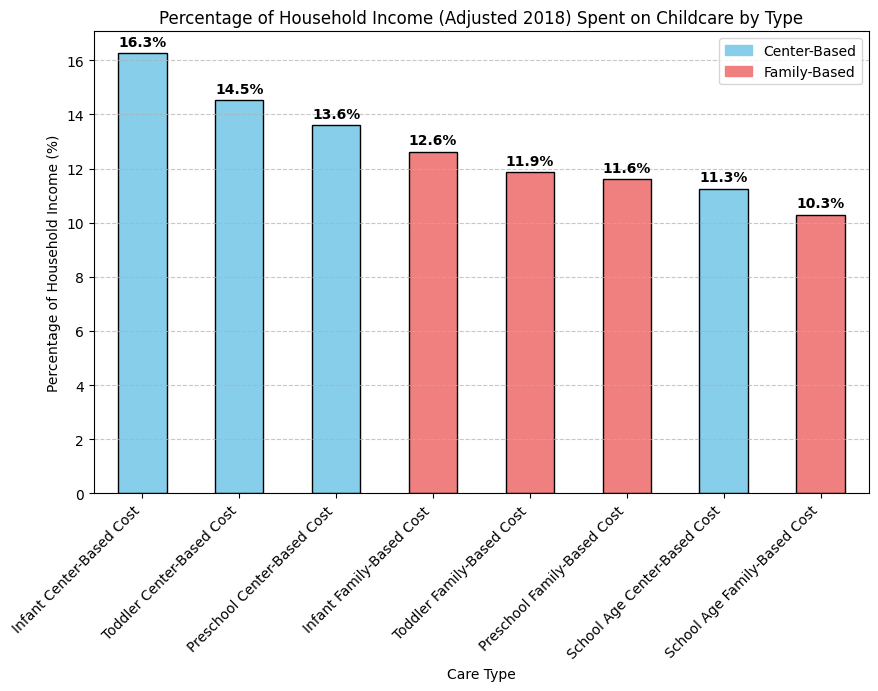

In [18]:
# Define colors for Center-Based and Family-Based categories
colors = {
    "Infant Center-Based Cost": "skyblue",
    "Toddler Center-Based Cost": "skyblue",
    "Preschool Center-Based Cost": "skyblue",
    "School Age Center-Based Cost": "skyblue",
    "Infant Family-Based Cost": "lightcoral",
    "Toddler Family-Based Cost": "lightcoral",
    "Preschool Family-Based Cost": "lightcoral",
    "School Age Family-Based Cost": "lightcoral",
}

avg_mhi_2018 = childcare_df["mhi_2018"].mean()

avg_percent_costs = (avg_annual_costs_2018 / avg_mhi_2018) * 100
avg_percent_costs = avg_percent_costs.sort_values(ascending=False)
print(avg_percent_costs)

# Create the corrected bar chart
plt.figure(figsize=(10, 6))
bars = avg_percent_costs.plot(kind="bar", color=[colors[label] for label in avg_percent_costs.index], edgecolor="black")

# Add labels and formatting
plt.xlabel("Care Type")
plt.ylabel("Percentage of Household Income (%)")
plt.title("Percentage of Household Income (Adjusted 2018) Spent on Childcare by Type")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Add value labels on bars, ensuring alignment with the correct bars
for bar in bars.patches:
    height = bar.get_height()
    bars.annotate(f"{height:.1f}%",
                  xy=(bar.get_x() + bar.get_width() / 2, height),
                  xytext=(0, 3),  # Offset label slightly above bar
                  textcoords="offset points",
                  ha="center", va="bottom", fontsize=10, fontweight="bold")

# Add legend
handles = [plt.Rectangle((0,0),1,1, color=color) for color in ["skyblue", "lightcoral"]]
labels = ["Center-Based", "Family-Based"]
plt.legend(handles, labels, loc="upper right")

# Show the plot
plt.show()

## **Urbanization Drives Costs Higher**

**What we did**<br/>
We compared average annual childcare costs across population-size buckets, by care type and age group.

**Why we did it**<br/>
To quantify the urban premium and see where families face the steepest prices.

**Key takeaway**<br/>
Costs increase with community size; metropolitan areas (1M+) are the most expensive—nearly double rural costs in some cases. Infant center-based care is consistently the costliest; family-based care is generally cheaper, particularly in smaller communities.

**Policy angle**<br/>
Understanding supply/demand conditions in urban vs. rural markets—and the availability of family-based care—requires better measurement to distinguish preference vs necessity.

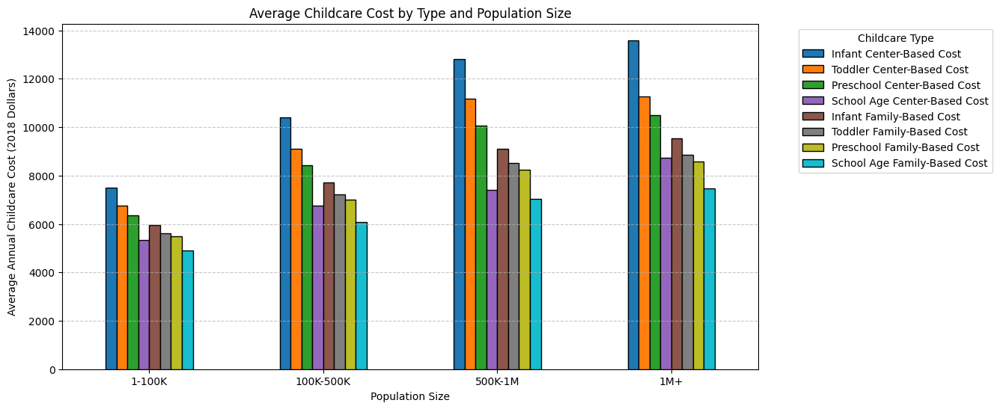

In [19]:
# Compute the average childcare cost by population size
avg_cost_by_pop_size = childcare_df.groupby("pop_size")[[f"{col}" for col in existing_original_cost_columns_2018]].mean()

# Rename dataframe columns
avg_cost_by_pop_size = avg_cost_by_pop_size.rename(columns=readable_labels_2018)

# Define the order for sorting population size categories
pop_size_order = ["1-100K", "100K-500K", "500K-1M", "1M+"]

# Reorder the index of the dataframe based on this order
avg_cost_by_pop_size = avg_cost_by_pop_size.reindex(pop_size_order)

# Plot the average childcare cost by type and population size
fig, ax = plt.subplots(figsize=(12, 6))
avg_cost_by_pop_size.plot(kind="bar", ax=ax, colormap="tab10", edgecolor="black")

# Add labels and formatting
ax.set_xlabel("Population Size")
ax.set_ylabel("Average Annual Childcare Cost (2018 Dollars)")
ax.set_title("Average Childcare Cost by Type and Population Size")
ax.legend(title="Childcare Type", bbox_to_anchor=(1.05, 1), loc="upper left")

# Rotate x-axis labels for readability
plt.xticks(rotation=0)

# Show grid for better readability
ax.yaxis.grid(True, linestyle="--", alpha=0.7)

# Show the plot
plt.show()

## **Costs & Race: Preference or Economic Constraint?**

**What we did**<br/>
We built a correlation heatmap between childcare cost share and race/ethnicity segments, split by care type and age band.

**Why we did it**<br/>
To surface disparities and probe whether patterns reflect cultural preferences or constraints (affordability, access, employer benefits, geography).

**Key takeaway**<br/>
* Asian & multiracial families show the strongest positive correlations, especially for infant/toddler center-based care.
* White families show negative correlations across types (possibly more informal care, employer benefits, or lower-cost areas).
* Black, Hispanic, Native American families show moderate positives; family-based care looks more balanced—hinting economic necessity over preference.

These patterns warrant deeper investigation into affordability/access, not just culture.

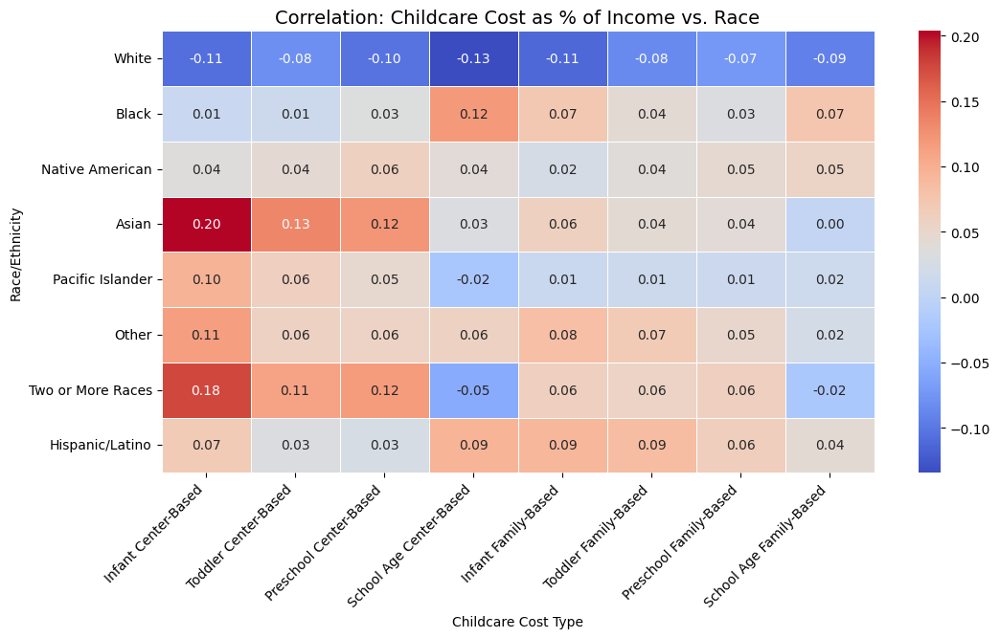

In [20]:
# Define updated correlation columns including childcare cost percentages and demographic data
correlation_columns = [
    f"{col}_pct_MHI_2018" for col in existing_cost_columns_to_adjust_2018
] + ["mhi_2018", "onerace_w", "onerace_b", "onerace_i", "onerace_a", "onerace_h", "onerace_other", "tworaces", "hispanic"]

# Ensure only existing columns are used
existing_correlation_columns = [col for col in correlation_columns if col in childcare_df.columns]

# Compute the correlation matrix including demographics
correlation_matrix = childcare_df[existing_correlation_columns].corr()

# Filter correlation matrix to only include races on the y-axis and childcare cost types on the x-axis
race_columns = ["onerace_w", "onerace_b", "onerace_i", "onerace_a", "onerace_h", "onerace_other", "tworaces", "hispanic"]
cost_columns_pct = [f"{col}_pct_MHI_2018" for col in existing_cost_columns_to_adjust_2018]

# Subset the correlation matrix
filtered_correlation_matrix = correlation_matrix.loc[race_columns, cost_columns_pct]

# Define a dictionary mapping column names to more user-friendly labels
friendly_names = {
    "infant_center_cost_2018_dollars_pct_MHI_2018": "Infant Center-Based",
    "toddler_center_cost_2018_dollars_pct_MHI_2018": "Toddler Center-Based",
    "preschool_center_cost_2018_dollars_pct_MHI_2018": "Preschool Center-Based",
    "school_age_center_cost_2018_dollars_pct_MHI_2018": "School Age Center-Based",
    "infant_family_cost_2018_dollars_pct_MHI_2018": "Infant Family-Based",
    "toddler_family_cost_2018_dollars_pct_MHI_2018": "Toddler Family-Based",
    "preschool_family_cost_2018_dollars_pct_MHI_2018": "Preschool Family-Based",
    "school_age_family_cost_2018_dollars_pct_MHI_2018": "School Age Family-Based",
    "onerace_w": "White",
    "onerace_b": "Black",
    "onerace_i": "Native American",
    "onerace_a": "Asian",
    "onerace_h": "Pacific Islander",
    "onerace_other": "Other",
    "tworaces": "Two or More Races",
    "hispanic": "Hispanic/Latino",
}

# Apply the friendly names mapping to the correlation matrix index and columns
filtered_correlation_matrix = filtered_correlation_matrix.rename(index=friendly_names, columns=friendly_names)


# Create a heatmap with races on the y-axis and childcare cost types on the x-axis
plt.figure(figsize=(12, 6))
sns.heatmap(filtered_correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)

# Add title and labels
plt.title("Correlation: Childcare Cost as % of Income vs. Race", fontsize=14)
plt.xlabel("Childcare Cost Type")
plt.ylabel("Race/Ethnicity")

# Rotate x-axis labels for readability
plt.xticks(rotation=45, ha="right")

# Show the heatmap
plt.show()


In [21]:
# # Compute the average childcare cost by year
# avg_cost_by_year = childcare_df.groupby("studyyear")[[f"{col}_2018_dollars" for col in cost_columns_to_adjust]].mean()

# # Compute the average median household income by year
# avg_mhi_by_year = childcare_df.groupby("studyyear")["mhi_2018"].mean()

# # Rename childcare cost columns to friendly names
# avg_cost_by_year = avg_cost_by_year.rename(columns=friendly_names)

# # Create the figure and axis
# fig, ax1 = plt.subplots(figsize=(12, 6))

# # Plot childcare costs on the primary y-axis
# for col in avg_cost_by_year.columns:
#     ax1.plot(avg_cost_by_year.index, avg_cost_by_year[col], marker='o', label=col)

# ax1.set_xlabel("Year")
# ax1.set_ylabel("Average Annual Childcare Cost (2018 Dollars)", color="blue")
# ax1.tick_params(axis='y', labelcolor="blue")

# # Create a secondary y-axis for median household income
# ax2 = ax1.twinx()
# ax2.plot(avg_mhi_by_year.index, avg_mhi_by_year, marker='s', color="red", linestyle="dashed", label="Median Household Income (2018)")
# ax2.set_ylabel("Median Household Income (2018 Dollars)", color="red")
# ax2.tick_params(axis='y', labelcolor="red")

# # Add legend
# ax1.legend(loc="upper left", bbox_to_anchor=(1.05, 1))
# ax2.legend(loc="upper left", bbox_to_anchor=(1.05, 0.9))

# # Add title
# plt.title("Trend of Childcare Costs and Median Household Income Over Time")

# # Show grid for readability
# ax1.grid(True, linestyle="--", alpha=0.7)

# # Show the plot
# plt.show()


## **A Decade of Rising Prices**

**What we did**<br/>
We plotted childcare prices over time by care type and compared them to median household income.

**Why we did it**<br/>
To show that after the 2009 crash, incomes fell and only gradually recovered, while childcare costs kept climbing—outpacing income growth and widening the affordability gap.

**Key takeaway**<br/>
By 2018, incomes rebounded, but prices remained elevated, implying persistent affordability challenges that likely forced difficult household trade-offs.

In [22]:
# Define color mapping for center-based (blue) and family-based (green) childcare types
color_mapping = {
    "infant_center_cost_2018_dollars": "#1f77b4",  # Blue (Center-Based)
    "toddler_center_cost_2018_dollars": "#3274a1",  # Blue (Center-Based)
    "preschool_center_cost_2018_dollars": "#4d8dc5",  # Blue (Center-Based)
    "school_age_center_cost_2018_dollars": "#6ea6da",  # Blue (Center-Based)
    "infant_family_cost_2018_dollars": "#2ca02c",  # Green (Family-Based)
    "toddler_family_cost_2018_dollars": "#66b266",  # Green (Family-Based)
    "preschool_family_cost_2018_dollars": "#99cc99",  # Green (Family-Based)
    "school_age_family_cost_2018_dollars": "#c2e0c2"  # Green (Family-Based)
}

# Compute the average childcare cost by year
avg_cost_by_year = childcare_df.groupby("studyyear")[[f"{col}_2018_dollars" for col in cost_columns_to_adjust]].mean()

# Compute the average median household income by year
avg_mhi_by_year = childcare_df.groupby("studyyear")["mhi_2018"].mean()

# Rename childcare cost columns to friendly names
avg_cost_by_year = avg_cost_by_year.rename(columns=friendly_names)

# Create the figure
fig = go.Figure()

# Add childcare cost traces with friendly names
for col in avg_cost_by_year.columns:
    fig.add_trace(go.Scatter(
        x=avg_cost_by_year.index,
        y=avg_cost_by_year[col],
        mode='lines+markers',
        name=readable_labels_2018.get(col, col),  # Use friendly name if available
        line=dict(color=color_mapping[col]),
        hovertemplate='%{y:.2f}'
    ))

# Add median household income trace on secondary y-axis
fig.add_trace(go.Scatter(
    x=avg_mhi_by_year.index,
    y=avg_mhi_by_year,
    mode='lines+markers',
    name="Median Household Income (2018)",
    line=dict(dash='dash', color='black'),
    hovertemplate='%{y:.2f}',
    yaxis="y2"
))

# Update layout with dual y-axes
fig.update_layout(
    title="Trend of Childcare Costs and Median Household Income Over Time",
    plot_bgcolor='white',
    xaxis=dict(title="Year", showgrid=True, gridcolor='lightgrey'),
    yaxis=dict(title="Average Annual Childcare Cost (2018 Dollars)", color="blue", showgrid=True, gridcolor='lightgrey'),
    yaxis2=dict(title="Median Household Income (2018 Dollars)", overlaying='y', side='right', color="black", showgrid=True, gridcolor='lightgrey'),
    legend=dict(x=1.05, y=1),
    hovermode="x unified"
)

# Show the plot
fig.show()


## **Workforce Participation**

**What we did**<br/>
We computed associations between childcare costs and labor outcomes (unemployment, labor force participation), with a focus on gender differences.

**Why we did it**<br/>
To test whether higher childcare costs co-move with higher unemployment and lower participation, especially for women.

**Key takeaway**<br/>
Warmer colors (higher cost ↔ higher unemployment) and cooler colors (higher participation ↔ lower cost share) show a clear headwind for mothers’ participation. Rising costs are linked to fewer women with young children remaining in the workforce.

**So what**<br/>
When parents—especially mothers—exit the labor force due to childcare costs, household earnings and overall productivity suffer, reinforcing gender disparities.

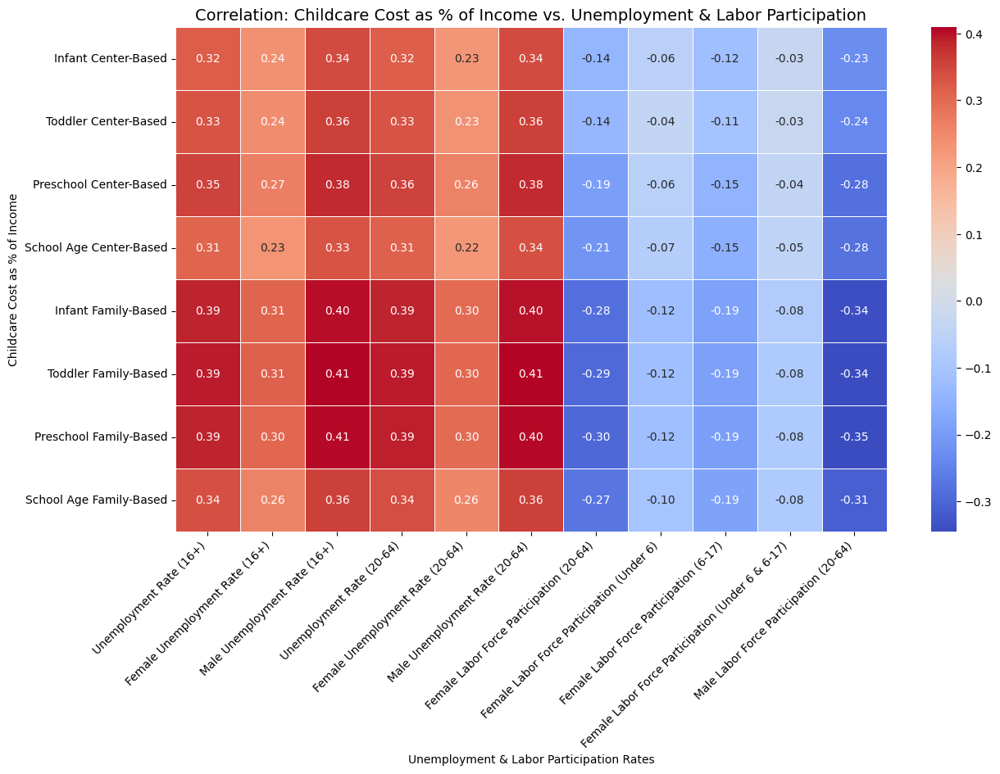

In [23]:
# Define columns for unemployment and labor participation rates
unemployment_columns = [
    "unr_16", "funr_16", "munr_16", 
    "unr_20to64", "funr_20to64", "munr_20to64"
]

labor_participation_columns = [
    "flfpr_20to64", "flfpr_20to64_under6", "flfpr_20to64_6to17", 
    "flfpr_20to64_under6_6to17", "mlfpr_20to64"
]

# Define friendly names for the columns
friendly_names = {
    "unr_16": "Unemployment Rate (16+)",
    "funr_16": "Female Unemployment Rate (16+)",
    "munr_16": "Male Unemployment Rate (16+)",
    "unr_20to64": "Unemployment Rate (20-64)",
    "funr_20to64": "Female Unemployment Rate (20-64)",
    "munr_20to64": "Male Unemployment Rate (20-64)",
    "flfpr_20to64": "Female Labor Force Participation (20-64)",
    "flfpr_20to64_under6": "Female Labor Force Participation (Under 6)",
    "flfpr_20to64_6to17": "Female Labor Force Participation (6-17)",
    "flfpr_20to64_under6_6to17": "Female Labor Force Participation (Under 6 & 6-17)",
    "mlfpr_20to64": "Male Labor Force Participation (20-64)",
    "infant_center_cost_2018_dollars_pct_MHI_2018": "Infant Center-Based",
    "toddler_center_cost_2018_dollars_pct_MHI_2018": "Toddler Center-Based",
    "preschool_center_cost_2018_dollars_pct_MHI_2018": "Preschool Center-Based",
    "school_age_center_cost_2018_dollars_pct_MHI_2018": "School Age Center-Based",
    "infant_family_cost_2018_dollars_pct_MHI_2018": "Infant Family-Based",
    "toddler_family_cost_2018_dollars_pct_MHI_2018": "Toddler Family-Based",
    "preschool_family_cost_2018_dollars_pct_MHI_2018": "Preschool Family-Based",
    "school_age_family_cost_2018_dollars_pct_MHI_2018": "School Age Family-Based"
}


# Define childcare cost percentage columns
childcare_cost_pct_columns = [f"{col}_pct_MHI_2018" for col in existing_cost_columns_to_adjust_2018]

# Ensure only existing columns are used
existing_unemployment_columns = [col for col in unemployment_columns if col in childcare_df.columns]
existing_labor_participation_columns = [col for col in labor_participation_columns if col in childcare_df.columns]
existing_childcare_cost_pct_columns = [col for col in childcare_cost_pct_columns if col in childcare_df.columns]

# Compute the correlation matrix between childcare cost and unemployment/labor participation rates
correlation_columns = existing_childcare_cost_pct_columns + existing_unemployment_columns + existing_labor_participation_columns
correlation_matrix = childcare_df[correlation_columns].corr()

# Extract relevant correlations
correlation_subset = correlation_matrix.loc[existing_childcare_cost_pct_columns, existing_unemployment_columns + existing_labor_participation_columns]

# Rename index and columns using friendly names where applicable
correlation_subset = correlation_subset.rename(index=friendly_names, columns=friendly_names)

# Create a heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(correlation_subset, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)

# Add title and labels
plt.title("Correlation: Childcare Cost as % of Income vs. Unemployment & Labor Participation", fontsize=14)
plt.xlabel("Unemployment & Labor Participation Rates")
plt.ylabel("Childcare Cost as % of Income")

# Rotate x-axis labels for readability
plt.xticks(rotation=45, ha="right")

# Show the heatmap
plt.show()


## **Prices vs. Household Income**

**What we did**<br/>
We overlaid childcare cost shares against median household income to assess affordability pressure.

**Why we did it**<br/>
To highlight how the cost share responds to income changes and whether relief measures (subsidies, tax credits) might have buffered families during downturns—evidence calls for but is currently incomplete.

**Key takeaway**<br/>
Costs outpaced income for much of the period. We flag a need for more data on assistance programs to evaluate their real-world effect.

In [24]:
# Properly reshape the data for scatter plotting
scatter_data = childcare_df.melt(
    id_vars=["unr_16", "funr_16", "munr_16", "unr_20to64", "funr_20to64", "munr_20to64",
             "flfpr_20to64", "flfpr_20to64_under6", "flfpr_20to64_6to17", 
             "flfpr_20to64_under6_6to17", "mlfpr_20to64"],  # Workforce metrics
    value_vars=["infant_center_cost_2018_dollars_pct_MHI_2018", "toddler_center_cost_2018_dollars_pct_MHI_2018", "preschool_center_cost_2018_dollars_pct_MHI_2018",
                "school_age_center_cost_2018_dollars_pct_MHI_2018", "infant_family_cost_2018_dollars_pct_MHI_2018", "toddler_family_cost_2018_dollars_pct_MHI_2018",
                "preschool_family_cost_2018_dollars_pct_MHI_2018", "school_age_family_cost_2018_dollars_pct_MHI_2018"],  # Childcare cost % of income
    var_name="Childcare Cost Type",
    value_name="Childcare Cost % of Income"
)

# Verify the structure of the melted dataset
scatter_data.head()

# Create scatter plot with trendlines
fig = px.scatter(
    scatter_data,
    x="Childcare Cost % of Income",  # Childcare cost as % of income
    y="unr_16",  # Example: Total Unemployment Rate (You can expand this to multiple facets)
    color="Childcare Cost Type",
    trendline="ols",  # Ordinary Least Squares (OLS) trendline
    # facet_col="Childcare Cost Type",
    title="Impact of Childcare Cost on Unemployment & Labor Participation",
    labels={"unr_16": "Unemployment & Labor Participation Rate", "Childcare Cost % of Income": "Childcare Cost as % of Income"},
    height=800,
    facet_col_wrap=2  # Organize subplots into 2 columns
)

# Update trendline color to black for clarity
for trace in fig.data:
    if "trendline" in trace.name:
        trace.line.color = "black"  # Make trendlines black
        
# Show the plot
fig.show()


In [25]:
# Update friendly names for better readability
workforce_friendly_names = {
    "infant_center_cost_2018_dollars_pct_MHI_2018": "Infant Center-Based",
    "toddler_center_cost_2018_dollars_pct_MHI_2018": "Toddler Center-Based",
    "preschool_center_cost_2018_dollars_pct_MHI_2018": "Preschool Center-Based",
    "school_age_center_cost_2018_dollars_pct_MHI_2018": "School Age Center-Based",
    "infant_family_cost_2018_dollars_pct_MHI_2018": "Infant Family-Based",
    "toddler_family_cost_2018_dollars_pct_MHI_2018": "Toddler Family-Based",
    "preschool_family_cost_2018_dollars_pct_MHI_2018": "Preschool Family-Based",
    "school_age_family_cost_2018_dollars_pct_MHI_2018": "School Age Family-Based"
}


In [26]:
# Define nodes (categories)
node_labels = [
    "High Childcare Cost", "Low Childcare Cost",  # Childcare Cost Categories
    "High Female Unemployment", "Low Female Unemployment",  # Female Unemployment
    "High Male Unemployment", "Low Male Unemployment",  # Male Unemployment
    "High Female Labor Participation", "Low Female Labor Participation",  # Female Labor Participation
    "High Male Labor Participation", "Low Male Labor Participation"  # Male Labor Participation
]

# Assign indices to nodes
node_indices = {label: idx for idx, label in enumerate(node_labels)}

# Define links (connections) between nodes based on assumed relationships
source_nodes = [
    node_indices["High Childcare Cost"], node_indices["High Childcare Cost"],  # High Cost -> High Unemployment
    node_indices["High Childcare Cost"], node_indices["High Childcare Cost"],  # High Cost -> Low Participation
    node_indices["Low Childcare Cost"], node_indices["Low Childcare Cost"],  # Low Cost -> Low Unemployment
    node_indices["Low Childcare Cost"], node_indices["Low Childcare Cost"],  # Low Cost -> High Participation
]

target_nodes = [
    node_indices["High Female Unemployment"], node_indices["High Male Unemployment"],  # High Unemployment
    node_indices["Low Female Labor Participation"], node_indices["Low Male Labor Participation"],  # Low Participation
    node_indices["Low Female Unemployment"], node_indices["Low Male Unemployment"],  # Low Unemployment
    node_indices["High Female Labor Participation"], node_indices["High Male Labor Participation"],  # High Participation
]

# Define link values (weights) based on assumed data (this can be updated with actual computed values)
link_values = [40, 35, 50, 45, 60, 55, 70, 65]  # Example placeholder values

# Create the Sankey diagram
fig = go.Figure(go.Sankey(
    node=dict(
        pad=20,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=node_labels
    ),
    link=dict(
        source=source_nodes,
        target=target_nodes,
        value=link_values
    )
))

# Update layout
fig.update_layout(title_text="Impact of Childcare Cost on Labor Participation & Unemployment", font_size=12)

# Show the plot
fig.show()


In [27]:
childcare_df.to_csv("../data/ndcp_python_full.csv")

In [28]:
# Ensure column names are lowercase for consistency
childcare_df.columns = childcare_df.columns.str.lower()

# Define the population size categories
pop_size_order = ["1-100K", "100K-500K", "500K-1M", "1M+"]

# Define the relevant columns for infant care cost
infant_columns = ["infant_center_cost_2018_dollars", "infant_family_cost_2018_dollars"]

# Compute the average childcare cost by type and population size
avg_cost_by_pop_size = childcare_df.groupby("pop_size")[infant_columns].mean()

# Reorder the index of the dataframe based on population size order
avg_cost_by_pop_size = avg_cost_by_pop_size.reindex(pop_size_order)

# Compute the price difference between urban (1M+) and small cities (1-100K)
urban_infant_cost = avg_cost_by_pop_size.loc["1M+"].mean()
small_city_infant_cost = avg_cost_by_pop_size.loc["1-100K"].mean()
price_difference = urban_infant_cost - small_city_infant_cost
percent_difference = price_difference/urban_infant_cost

In [29]:
print(percent_difference)

0.41847560914930837


## **Methods Notes**

* Comparisons over time use consistent price levels where applicable to avoid inflation bias.
* Population-size buckets proxy urbanization; we also stratify by care type (center vs family) and age to avoid mixing cost structures.
* Correlations/heatmaps are descriptive—used to guide hypotheses about labor outcomes and disparities, not to claim causation.

## **Limitations & Data Gaps**

The NDCP is valuable, but we still lack:
* Finer geographic & demographic segmentation to pinpoint access and affordability issues,
* Targeted surveys to tell voluntary vs forced workforce exits,
* Program-level data (subsidies, tax credits, employer benefits) to estimate policy impact on market prices and access.

**Takeaway:** Better measurement is a precondition for better policy.

## **Conclusions**

* Prices rose faster than incomes, creating persistent affordability challenges.
* Urban areas are costliest; infant center-based care carries the highest burden.
* Higher childcare costs align with higher unemployment and lower labor force participation, especially among mothers.
* Racial/ethnic patterns suggest a mix of preference and constraint, requiring deeper study of affordability, access, and employer support.

**Call to Action:** Invest in better data collection and transparency to design policies that improve affordability, accessibility, and economic stability.